In [2]:
import cv2
import matplotlib.pyplot as plt
import cvlib as cv
import os
import numpy as np
from cvlib.object_detection import draw_bbox

Using TensorFlow backend.


In [3]:
path = "/home/aman/Documents/Project/DepthCal/Code/Data/"
right = path + "right/"
left = path + "left/"

In [26]:
f = []
for (root,dirs,files) in os.walk(right, topdown=True):
    f.append(files)
    
files.sort()
files

['frame0001.jpg',
 'frame0003.jpg',
 'frame0005.jpg',
 'frame0007.jpg',
 'frame0009.jpg',
 'frame0011.jpg',
 'frame0013.jpg',
 'frame0015.jpg',
 'frame0017.jpg',
 'frame0019.jpg',
 'frame0021.jpg',
 'frame0023.jpg',
 'frame0025.jpg',
 'frame0027.jpg',
 'frame0029.jpg',
 'frame0031.jpg',
 'frame0033.jpg',
 'frame0035.jpg',
 'frame0037.jpg',
 'frame0039.jpg',
 'frame0041.jpg',
 'frame0043.jpg',
 'frame0045.jpg',
 'frame0047.jpg',
 'frame0049.jpg',
 'frame0051.jpg',
 'frame0053.jpg',
 'frame0055.jpg',
 'frame0057.jpg',
 'frame0059.jpg',
 'frame0061.jpg',
 'frame0063.jpg',
 'frame0065.jpg',
 'frame0067.jpg',
 'frame0069.jpg',
 'frame0071.jpg',
 'frame0073.jpg',
 'frame0075.jpg',
 'frame0077.jpg',
 'frame0079.jpg',
 'frame0081.jpg',
 'frame0083.jpg',
 'frame0085.jpg',
 'frame0087.jpg',
 'frame0089.jpg',
 'frame0091.jpg',
 'frame0093.jpg',
 'frame0095.jpg',
 'frame0097.jpg',
 'frame0099.jpg',
 'frame0101.jpg',
 'frame0103.jpg',
 'frame0105.jpg',
 'frame0107.jpg',
 'frame0109.jpg',
 'frame011

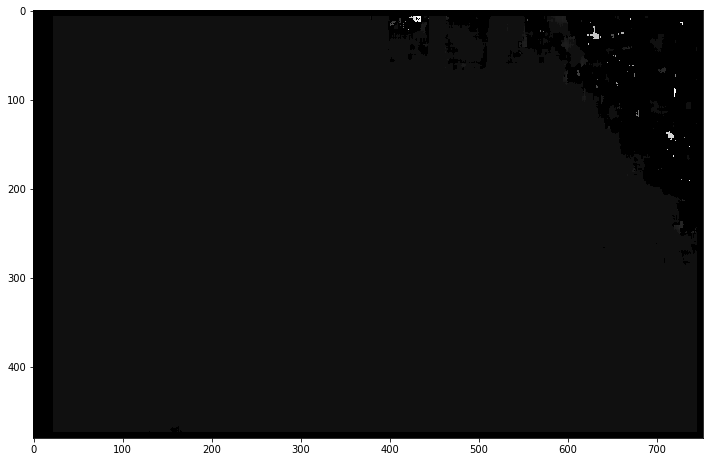

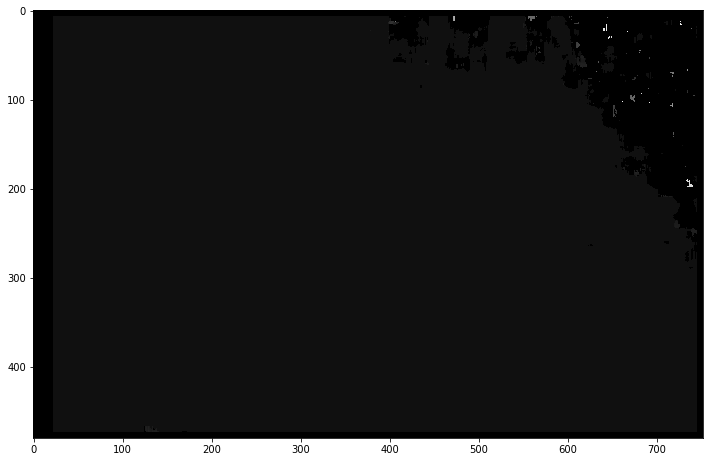

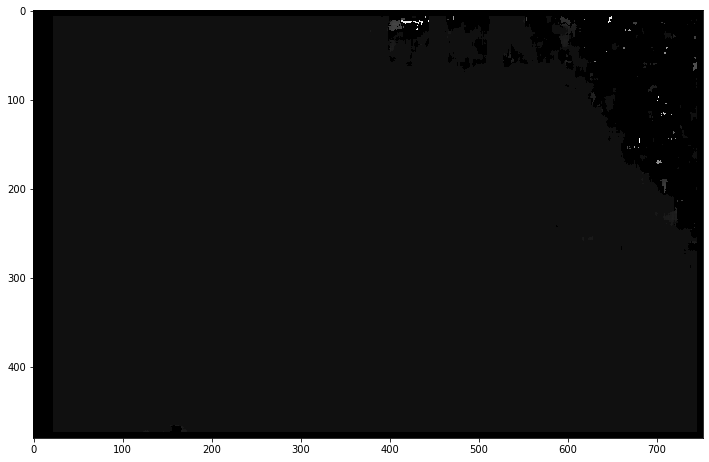

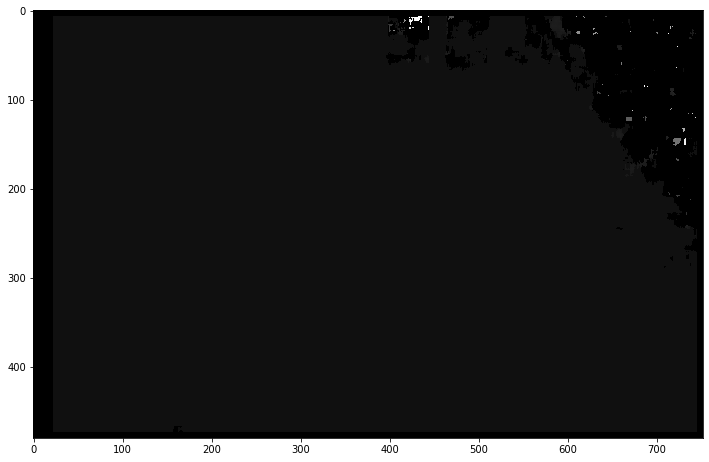

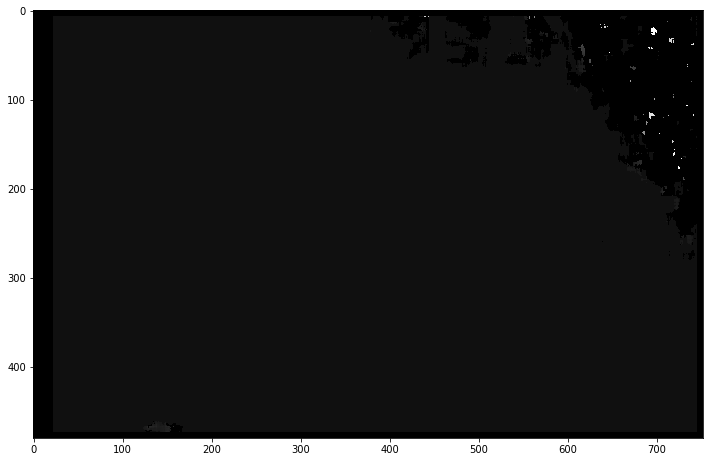

...

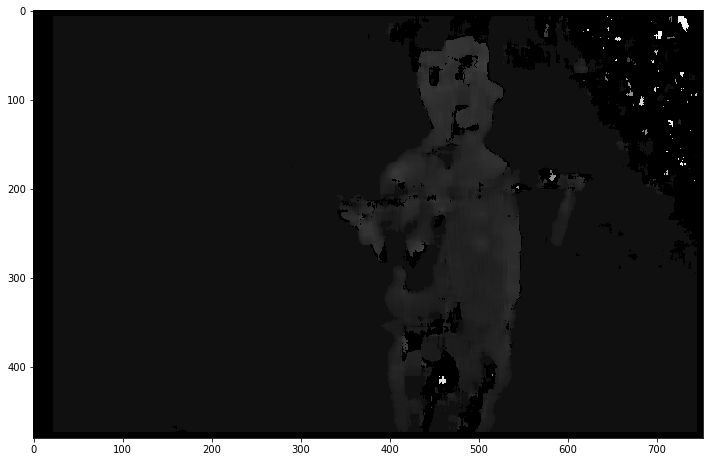

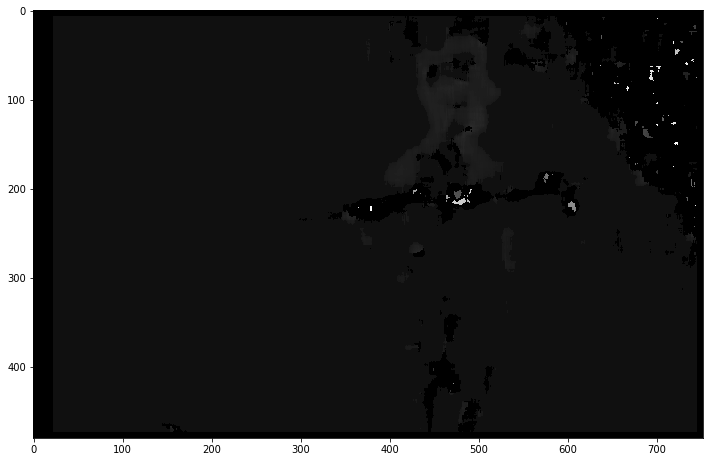

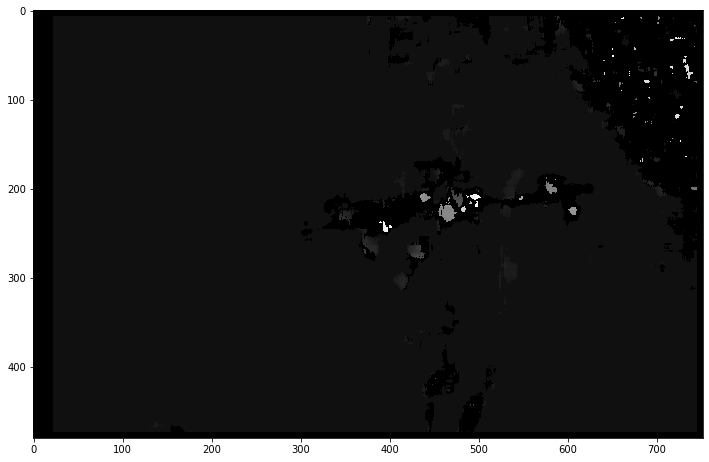

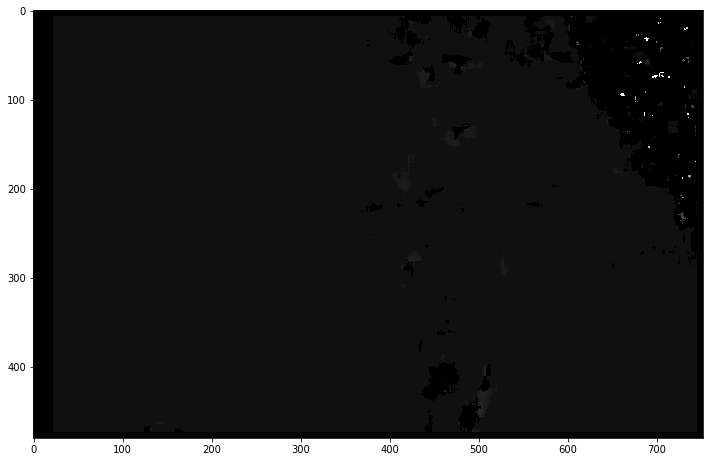

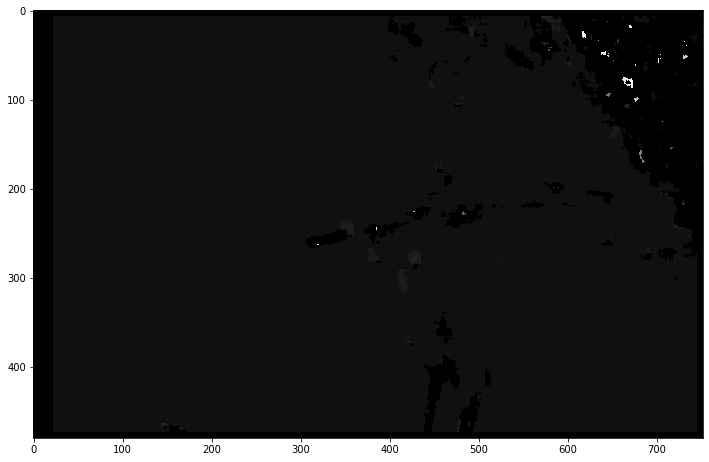

In [5]:
for i in range(len(files)):
    imgR = cv2.imread(right + files[i], 0)
    a = int(files[i][5:-4])
    a = a-1
    a = str(a)
    a = '{0}'.format(a.zfill(4))
    imgL = cv2.imread(left + files[i][0:5] + a + ".jpg", 0)
    
    stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
    disparity = stereo.compute(imgL, imgR)
    
    plt.figure(figsize=(12, 8))
    plt.imshow(disparity,'gray')
    plt.show()

In [6]:
np.unique(disparity)

array([-16,   0,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,
        19,  20,  21,  23,  24,  26,  27,  28,  29,  30,  31,  45,  46,
        47,  48,  49,  50,  51,  53,  60,  62,  63,  65,  66,  75,  76,
        77,  78,  79,  83,  84,  85,  91,  92,  93,  99, 100, 101, 102,
       103, 109, 110, 111, 112, 113, 114, 115, 116, 117, 139, 143, 144,
       145, 178, 182, 183, 185, 186, 187, 188, 189, 212, 213, 214, 215,
       217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229,
       240], dtype=int16)

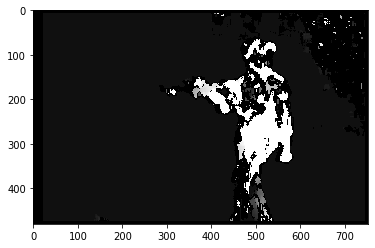

In [15]:
i = 100

imgR = cv2.imread(right + files[i], 0)
a = int(files[i][5:-4])
a = a-1
a = str(a)
a = '{0}'.format(a.zfill(4))
imgL = cv2.imread(left + files[i][0:5] + a + ".jpg", 0)
    
stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = stereo.compute(imgL, imgR)

plt.imshow(disparity, 'gray')
plt.show()

In [16]:
disparity.shape

(480, 752)

In [17]:
disparity[300][500]

240

In [18]:
disparity

array([[-16, -16, -16, ..., -16, -16, -16],
       [-16, -16, -16, ..., -16, -16, -16],
       [-16, -16, -16, ..., -16, -16, -16],
       ...,
       [-16, -16, -16, ..., -16, -16, -16],
       [-16, -16, -16, ..., -16, -16, -16],
       [-16, -16, -16, ..., -16, -16, -16]], dtype=int16)

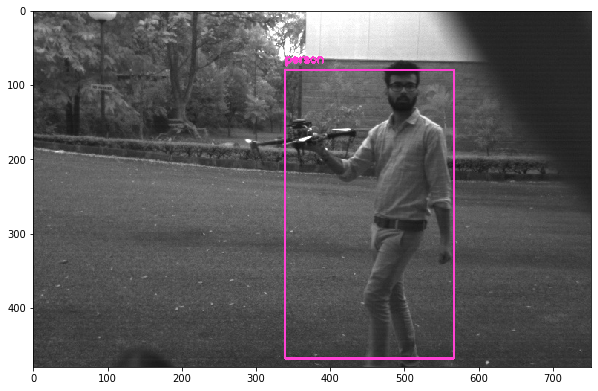

In [19]:
imgR = cv2.imread(right + files[i])
bboxR, labelR, confR = cv.detect_common_objects(imgR)
output_imageR = draw_bbox(imgR, bboxR, labelR, confR)

plt.figure(figsize = (10, 8))
plt.imshow(output_imageR)
plt.show()

In [20]:
bboxR

[[339, 80, 567, 468]]

In [21]:
ct = 0
d = 0

for i in range(bboxR[0][1], (bboxR[0][3]+1)):
    for j in range(bboxR[0][0], (bboxR[0][2]+1)):
        if(disparity[i][j] != 0):
            d = d+abs(disparity[i][j])
            ct = ct+1

In [22]:
ct

41134

In [24]:
d = d/ct

In [ ]:
for i in range(bboxR[0][1], (bboxR[0][3]+1)):
    for j in range(bboxR[0][0], (bboxR[0][2]+1)):
        if(disparity[i][j] != 0):
            d = d+abs(disparity[i][j])
            ct = ct+1
            
w, h = 752, 480;
li = [[0 for x in range(w)] for y in range(h)]

for i in range(w):
                    for j in range(h):
                        if(disparity[j][h] != 0):
                            li[j][i] = d
                        else:
                            li[j][i] = 0

In [35]:
imgR = cv2.imread(right + 'frame0077.jpg', 0)
imgL = cv2.imread(left + 'frame0076.jpg', 0)

In [36]:
imgR

array([[81, 74, 73, ..., 54, 55, 54],
       [78, 78, 75, ..., 53, 55, 53],
       [69, 84, 77, ..., 53, 54, 53],
       ...,
       [65, 69, 69, ..., 53, 53, 57],
       [61, 60, 62, ..., 50, 47, 51],
       [51, 62, 63, ..., 52, 49, 52]], dtype=uint8)

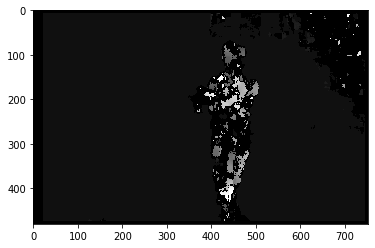

In [37]:
stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)
disparity = stereo.compute(imgL, imgR)

plt.imshow(disparity,'gray')
plt.show()

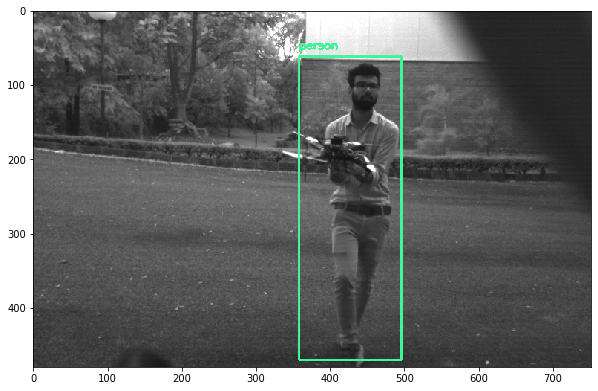

In [38]:
imgR = cv2.imread(right + 'frame0077.jpg')
bboxR, labelR, confR = cv.detect_common_objects(imgR)
output_imageR = draw_bbox(imgR, bboxR, labelR, confR)

plt.figure(figsize = (10, 8))
plt.imshow(output_imageR)
plt.show()

In [39]:
bboxR

[[358, 62, 496, 470]]

In [40]:
ct = 0
d = 0

for i in range(62, 470):
    for j in range(358, 496):
        if(disparity[i][j] != 0):
            d = d+abs(disparity[i][j])
            ct = ct+1

In [41]:
d/ct

48.8903375783303

In [42]:
ct

29682